In [ ]:
!pip install geodatasets
!pip install rasterstats

# Analyze Boreal Height CMIP6 Predictions with recent trends
sample plots from Rotbarth et al 2023 are in supplemental info here:
https://www.nature.com/articles/s41467-023-39092-2#Sec20  
TODO:  
 - recent trends from Landsat should be extracted and summarized by these plots  
 - future predictions should be extracted and summarized by these plots

In [90]:
from plotnine import *
import pandas as pd
import geopandas as gpd
from geodatasets import get_path
import folium
import contextily as ctx
import rasterio

In [2]:
df = pd.read_csv('/explore/nobackup/people/mfrost2/projects/boreal_hcan/data/boreal_ecotone_diff.csv')

In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 11032512 entries, 0 to 11032511
Data columns (total 6 columns):
 #   Column     Dtype  
---  ------     -----  
 0   vert       int64  
 1   horiz      int64  
 2   hcan_diff  float64
 3   year       object 
 4   ssp        object 
 5   ecotone    object 
dtypes: float64(1), int64(2), object(3)
memory usage: 505.0+ MB


/home/pmontesa/.local/lib/python3.8/site-packages/plotnine/layer.py:333: PlotnineWarning: stat_boxplot : Removed 2585136 rows containing non-finite values.


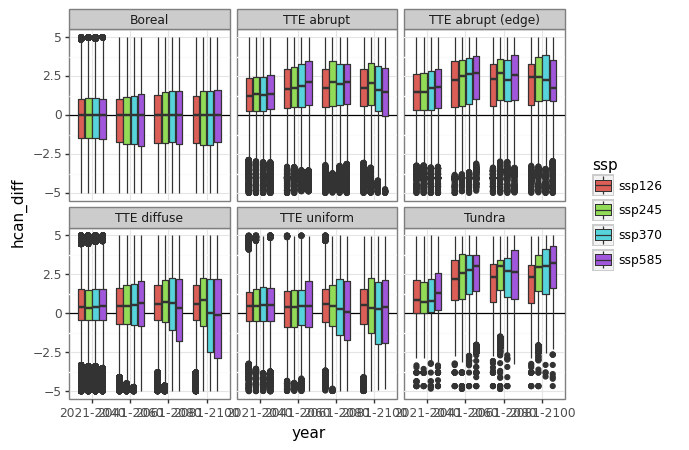

<ggplot: (1399909106999)>

In [6]:
(
    ggplot(df, aes(y='hcan_diff', x='year', fill='ssp'))
           + geom_hline(yintercept=0)
           + geom_boxplot()
           + scale_y_continuous(limits=(-5,5))
           + facet_wrap('~ecotone')
            + theme(figure_size=(10,4))
           + theme_bw()
)

In [4]:
df.head()

,vert,horiz,hcan_diff,year,ssp,ecotone
0,189,599,-3.945647,2021-2040,ssp126,Boreal Forest (taiga)
1,337,1596,0.087311,2021-2040,ssp585,TTE (abrupt)
2,337,1594,0.087311,2021-2040,ssp585,TTE (abrupt)
3,337,373,-5.707275,2021-2040,ssp585,TTE (abrupt)
4,337,372,-0.043730,2021-2040,ssp585,TTE (abrupt)


## Example with sample plots from Rotbarth et al 2023
https://doi.org/10.1038/s41467-023-39092-2

In [5]:
plots = pd.read_csv('/home/pmontesa/mfrost2/projects/boreal_hcan/rotbarth_etal_2023_naturecomms_plots_41467_2023_39092_MOESM4_ESM.csv')

In [54]:
PLOT_CENTROID_BUF_DISTANCE = 0.025 #degrees
plots_gdf = gpd.GeoDataFrame(plots, geometry = gpd.points_from_xy(plots.lon, plots.lat), crs="EPSG:4326")
plots_gdf['geometry'] = plots_gdf.geometry.buffer(PLOT_CENTROID_BUF_DISTANCE).envelope # Make plot box

/tmp/ipykernel_1694794/4038108226.py:2: UserWarning: Geometry is in a geographic CRS. Results from 'buffer' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.



Defaulting to user installation because normal site-packages is not writeable


/panfs/ccds02/app/modules/jupyter/ilab/tensorflow-kernel/lib/python3.8/site-packages/geopandas/tools/clip.py:63: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
/panfs/ccds02/app/modules/jupyter/ilab/tensorflow-kernel/lib/python3.8/site-packages/geopandas/tools/clip.py:63: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`


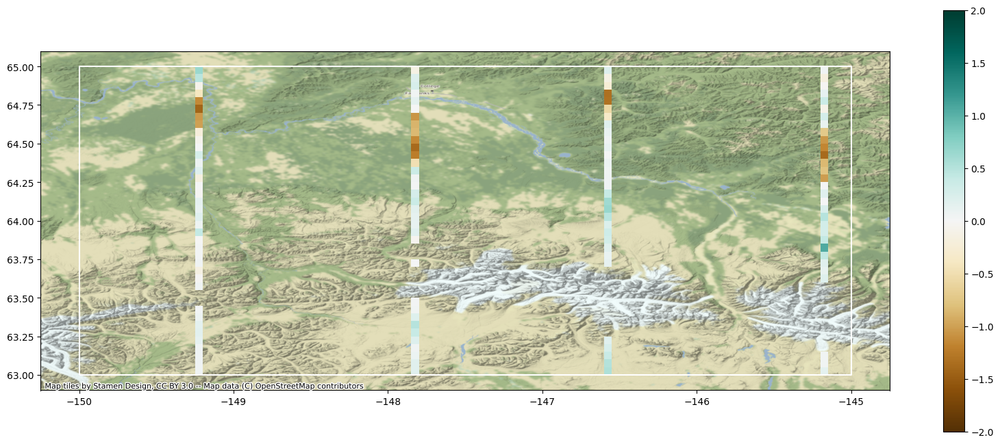

In [80]:
clip_list = [-150, 63, -145, 65]
world = gpd.read_file(get_path("naturalearth.land"))

# We restrict to South America.
ax = world.clip(clip_list).boundary.plot(color="black", edgecolor="black", figsize=(20,8))

# We can now plot our ``GeoDataFrame``.
ax = plots_gdf.clip(clip_list).plot(ax=ax, column='trend.yp', cmap='BrBG', vmin=-2, vmax=2, markersize=5, legend=True)

ctx.add_basemap(ax=ax, crs=4326)

In [61]:
# % change in MODIS TCC per year
# Tree cover change based on Theil-Sen-slopes (using Yue-Pilon’s pre-whitening method)
m = plots_gdf.explore(column=plots_gdf['trend.yp'], cmap='BrBG', vmin=-2, vmax=2, legend=True, name='Sample pts')
folium.LayerControl().add_to(m)
m

In [81]:
import os, sys
sys.path.append('/home/pmontesa/code/geoscitools')
import geoscilib

In [87]:
r_fn = '/home/pmontesa/pmontesa_projects/ilab/boreal_height_cmip/output_extract_stack/tccslope_8080205610_cog.tif'
HYBAS_ID = r_fn.split('_')[-2]
HYBAS_ID

'8080205610'

In [218]:
gdf_fn = '/home/pmontesa/pmontesa_projects/ilab/boreal_height_cmip/hydrobasins_L08_patterns_tte_boreal_tundra-tte_boreal_tundra-reprj.gpkg'
gdf_fn = '/panfs/ccds02/nobackup/people/mfrost2/projects/boreal_hcan/GIS/ecotone_full.gpkg'
GDF = gpd.read_file(gdf_fn)


['7080024740', '7080024480', '7080024470', '7080024330']

In [220]:
GDF.cx[-180:180, 60:65].HYBAS_ID.to_list()[0:4]

['8080279620', '8080285990', '8080276800', '8080269420']

In [159]:
ids = GDF["HYBAS_ID"]
GDF[ids.isin(ids[ids.duplicated()])].sort_values("HYBAS_ID")

,HYBAS_ID,pattern_class,geometry
2166,7080019440,TTE (abrupt),"POLYGON ((-129.92464 56.26838, -129.92882 56.2..."
14522,7080019440,Boreal Forest (taiga),"MULTIPOLYGON (((-129.82832 55.94498, -129.8300..."
2165,7080019800,TTE (abrupt),"MULTIPOLYGON (((-130.60736 56.22045, -130.6022..."
14523,7080019800,Boreal Forest (taiga),"MULTIPOLYGON (((-130.75057 56.14388, -130.7547..."
2164,7080019850,TTE (abrupt),"MULTIPOLYGON (((-131.28133 56.20353, -131.2728..."
...,...,...,...
13700,8080342560,Boreal Forest (taiga),"POLYGON ((-116.19167 54.23750, -116.18750 54.2..."
8342,8080342730,Non-forest (tundra),"MULTIPOLYGON (((-116.53246 54.04515, -116.5319..."
13728,8080342730,Boreal Forest (taiga),"POLYGON ((-116.81667 53.85833, -116.82012 53.8..."
8343,8080343770,Non-forest (tundra),"MULTIPOLYGON (((-116.32674 53.93785, -116.3343..."


In [157]:

GDF = GDF[GDF.HYBAS_ID == HYBAS_ID]
m = GDF.iloc[[0]].geometry.boundary.explore(color='blue')
GDF.iloc[[1]].geometry.boundary.explore(m=m, color='red')

In [221]:
def rename_columns(GDF, bandname, stats_list):
    if stats_list is not None:
        names_list = ['val_'+ bandname + '_' + s for s in stats_list]
        rename_dict = dict(zip(stats_list, names_list))      
        GDF = GDF.rename(columns = rename_dict)
        
    return GDF
def extract_zonal_gdf_poly(r_fn, GDF, bandnames: list, ndval=255, reproject=True, stats_list = ['max','min','median','mean','percentile_98','count']):
    
    from rasterstats import zonal_stats
    import numpy as np
    
    gdf_list = []
    
    with rasterio.open(r_fn) as r_src:
        print("\tExtracting raster values from: ", r_fn)

        for i, bandname in enumerate(bandnames):
            
            bnum = i + 1
            print(bnum)
            # Get array
            array = r_src.read(bnum)
            array = array.astype('float64')
            array[array==ndval] = np.nan
            df = pd.DataFrame(
                    zonal_stats(
                        vectors=GDF.to_crs(r_src.crs), 
                        raster= array,#r_src.read(bnum, masked=True),
                        affine= r_src.transform,
                        stats=stats_list
                    )
            )

            # Rename cols
            df = rename_columns(df, bandname, stats_list)

            final_gdf = GDF.reset_index().join(df.reset_index(drop=True), how='left')
            gdf_list.append(final_gdf)
            
    return pd.concat(gdf_list)

z = extract_zonal_gdf_poly(r_fn, GDF[GDF.HYBAS_ID == HYBAS_ID].iloc[[0]], bandnames=['tcc_slope'], reproject=False)
z

	Extracting raster values from:  /home/pmontesa/pmontesa_projects/ilab/boreal_height_cmip/output_extract_stack/tccslope_8080205610_cog.tif
1


,index,HYBAS_ID,pattern_class,geometry,val_tcc_slope_min,val_tcc_slope_max,val_tcc_slope_mean,val_tcc_slope_count,val_tcc_slope_median,val_tcc_slope_percentile_98
0,4509,8080205610,TTE (diffuse),"POLYGON ((-142.66194 63.81470, -142.65889 63.8...",-3.849404,3.426365,-0.649513,522958,-0.519048,2.024461


In [187]:
import rasterstats
import numpy as np
with rasterio.open(r_fn) as r_src:
    print(r_src.profile['nodata'])
    for i, bandname in enumerate(bandnames):
        bnum = i + 1
        # Get array
        array = r_src.read(bnum)
        
        array = array.astype('float64')
        array[array==255.0] = np.nan

        x = pd.DataFrame(rasterstats.zonal_stats(
                                vectors=GDF[GDF.HYBAS_ID == HYBAS_ID].iloc[[0]].to_crs(r_src.crs).geometry, 
                                raster= array,
                                affine= r_src.transform,
                                stats=['max','min','median','mean','percentile_02','percentile_25','percentile_75','percentile_98','count']
        )
        x[ID_COL_NAME] = ID
    )
x


None


[{'min': -3.8494040966033936,
  'max': 3.426365375518799,
  'mean': -0.6495125790126645,
  'count': 522958,
  'median': -0.5190476179122925,
  'percentile_02': -3.174858331680298,
  'percentile_25': -1.8734854459762573,
  'percentile_75': 0.423336960375309,
  'percentile_98': 2.0244605112075806}]

In [115]:
z = geoscilib.extract_zonal_gdf(r_fn, GDF[GDF.HYBAS_ID == HYBAS_ID], bandnames=['tcc_slope'], reproject=False, return_src_path=False, OUTDIR=None, OUTNAME=None)

polygon
	Extracting raster values from:  /home/pmontesa/pmontesa_projects/ilab/boreal_height_cmip/output_extract_stack/tccslope_8080205610_cog.tif
	Re-project geodataframe to match raster...
\Finished zonal_stats for 2 features (polygon) with raster info from 1 bands: ['tcc_slope']


In [116]:
import maplib
m = folium.Map(width=500,height=300, location=(z.to_crs(4326).geometry.centroid.y.mean(), z.to_crs(4326).geometry.centroid.x.mean()),
        zoom_start=8, control_scale=True, tiles=None)
maplib.basemaps['Imagery'].add_to(m)
maplib.basemaps['basemap_gray'].add_to(m)
maplib.basemaps['ESRINatGeo'].add_to(m)
m = z.to_crs(4326).explore(m = m, tiles=maplib.basemap_xyz_url['esri_natgeo'], attr=' ', name=HYBAS_ID)
folium.LayerControl().add_to(m)
m

/tmp/ipykernel_1694794/1713346907.py:2: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

/tmp/ipykernel_1694794/1713346907.py:2: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

